# this notebook combines all selected samples ( 3 WT and the mutant sample 5 and the new mutant sample )
- subsampling of the WT process should be only performed in the epithelial compartment 
- perform enrichment, cell type composition and brushborder gene expression analysis

In [1]:
import scanpy as sc 
import numpy as np
import pandas as pd
import os
import sys
from matplotlib import pyplot as plt
import anndata as ad


In [2]:
import seaborn as sn

In [3]:
sys.path.append("/home/lucy/star_proto_filter/")
sys.path.append("/home/lucy/")
sys.path.append("/home/lucy/AmbientContaminationMetrics/")
#sys.path.append("/home/lucy/quality/plot_quality_score.py")


In [4]:
import zc_filter_function as zc_filter
import quality_control_function as zc_qc
import plot_quality_score as qc_plt
import zc_function as zc

In [5]:
filtered_data_dir = '/home/lucy/Dropbox (VU Basic Sciences)/random_data_check/filtered_data/'

## load and combine data

In [5]:
# load dataset 1-3, 5 and 6
combined_1236 = sc.read("./new_sample_10868_filtered/combined_dat1246.h5ad") # should be 1236

In [6]:
dat5 = sc.read("./new_sample_10868_filtered/10868_5.h5ad")

In [7]:
combined_1236

AnnData object with n_obs × n_vars = 14618 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'Mitochondrial', 'mean', 'std'
    uns: 'cell_type_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [8]:
dat5

AnnData object with n_obs × n_vars = 4505 × 23312
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'cell_type_old', 'cytotrace'
    var: 'Mitochondrial', 'ambient', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'cell_type_clusters', 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'paneth', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'unknown_clusters'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [9]:
combined_1236.obs['treatment'].unique()

['WT', 'Mut']
Categories (2, object): ['Mut', 'WT']

In [10]:
combined_1236.obs['condition'].unique()

['WT', 'Mtgr1 -/-']
Categories (2, object): ['Mtgr1 -/-', 'WT']

In [11]:
# add condition column to data 5 obs
dat5.obs['condition'] = ['Mtgr1 -/-' for i in dat5.obs.index]

In [12]:
#combined_1236.X.sum(axis = 1)

In [13]:
#dat5.X.sum(axis = 1)

In [14]:
com = ad.concat( [combined_1236, dat5], merge='same' )

In [15]:
com

AnnData object with n_obs × n_vars = 19123 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'Mitochondrial'
    obsm: 'X_pca', 'X_umap'
    layers: 'arcsinh', 'raw_counts'

In [41]:
com.raw.X.sum( axis = 1)

matrix([[80421.],
        [75866.],
        [70448.],
        ...,
        [  887.],
        [  882.],
        [  880.]], dtype=float32)

## visualization of the combined data

In [16]:
com.raw = com.copy()

In [17]:
zc.normalization( com)

AnnData object with n_obs × n_vars = 19123 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'Mitochondrial', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'
    layers: 'arcsinh', 'raw_counts'

In [18]:
zc.clustering( com)

/home/lucy/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


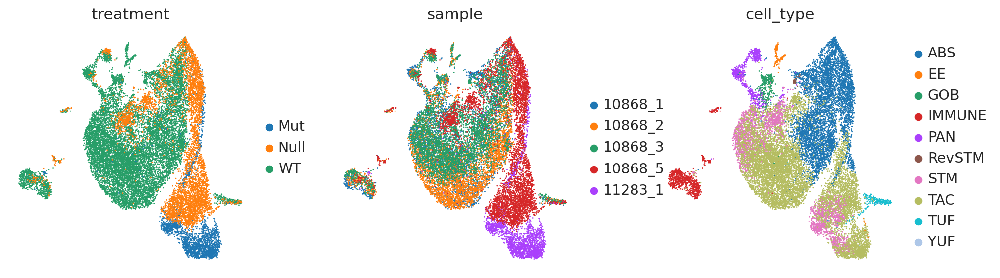

In [19]:
sc.pl.umap( com, color = ['treatment', 'sample', 'cell_type'] )

fix errors of some labels

In [20]:
treatment_col = com.obs['treatment'].copy()
for i in treatment_col.index:
    label = treatment_col.loc[i]
    if( label == 'Mut'):
        treatment_col.loc[i] = 'Null'
        

In [21]:
ct_col = com.obs['cell_type'].copy()
for i in ct_col.index:
    label = ct_col.loc[i]
    if( label == 'YUF'):
        ct_col.loc[i] = 'TUF'

In [22]:
com.obs['treatment'] = treatment_col.astype(str)
com.obs['cell_type'] = ct_col.astype(str)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


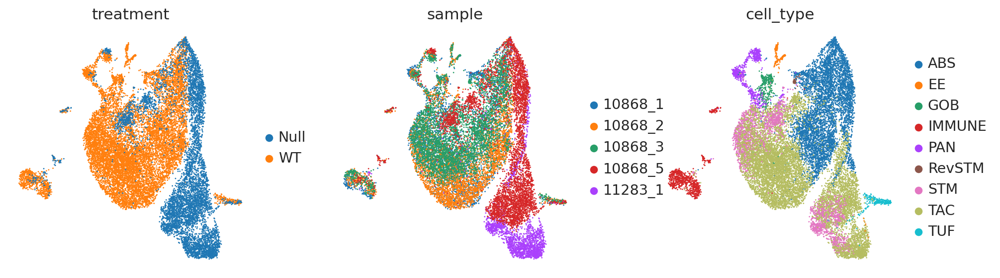

In [23]:
sc.pl.umap( com, color = ['treatment', 'sample', 'cell_type'] )

In [42]:
com.X.sum(axis = 1)

array([ 1033.8281,  1062.2852,  1628.4524, ..., -2575.4204, -2595.9565,
       -2613.661 ], dtype=float32)

## subsample the dataset to keep only epithelial cells and make sure even cell number between WT and Mutant

In [43]:
com.X = com.raw.X
com.X.sum(axis = 1)

matrix([[80421.],
        [75866.],
        [70448.],
        ...,
        [  887.],
        [  882.],
        [  880.]], dtype=float32)

In [44]:
epi = com[~np.isin( com.obs['cell_type'], "IMMUNE" )]

In [45]:
epi

View of AnnData object with n_obs × n_vars = 18286 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'Mitochondrial', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'distances', 'connectivities'

In [46]:
wt = epi[epi.obs['treatment'] == 'WT' ]
mut = epi[epi.obs['treatment'] == 'Null' ]

In [47]:
wt

View of AnnData object with n_obs × n_vars = 11859 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'Mitochondrial', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'distances', 'connectivities'

In [48]:
mut

View of AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'Mitochondrial', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'distances', 'connectivities'

In [49]:
sc.pp.subsample( wt, n_obs = mut.n_obs) 

In [50]:
dat_subsample = ad.concat( [wt, mut] )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


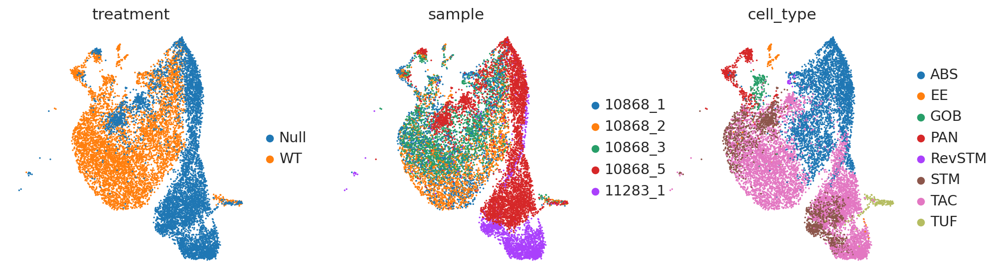

In [51]:
sc.pl.umap( dat_subsample, color = ['treatment', 'sample', 'cell_type'] )

In [52]:
dat_subsample.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [53]:
dat_subsample.raw = dat_subsample.copy()

In [54]:
zc.normalization( dat_subsample)

AnnData object with n_obs × n_vars = 12854 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'treatment_colors', 'sample_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'arcsinh', 'raw_counts'

In [55]:
dat_subsample.layers['full_norm'] = dat_subsample.X.copy()

In [56]:
zc.clustering( dat_subsample)

In [57]:
sc.tl.leiden( dat_subsample, resolution= 1)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


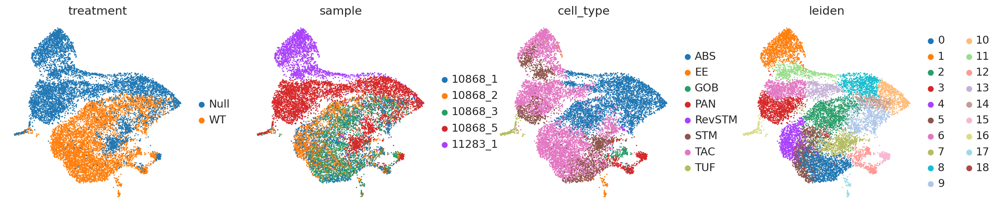

In [58]:
sc.pl.umap( dat_subsample, color = ['treatment', 'sample', 'cell_type', 'leiden'] )

In [59]:
dat_subsample.X = dat_subsample.raw.X

## enrichment for Stem cells

In [73]:
dat_subsample = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [74]:
stem = dat_subsample[dat_subsample.obs['cell_type'] == 'STM']

In [75]:
stem

View of AnnData object with n_obs × n_vars = 1765 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [76]:
stem.raw = stem.copy()

In [77]:
stem.X.sum( axis = 1)

matrix([[4041.],
        [2341.],
        [2860.],
        ...,
        [ 887.],
        [ 885.],
        [ 887.]], dtype=float32)

In [78]:
zc.normalization( stem)

AnnData object with n_obs × n_vars = 1765 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

### get STEM DGE

In [79]:
sc.tl.rank_genes_groups( stem, groupby='condition',  reference= 'WT', use_raw= False, layer='arcsinh', method = 'wilcoxon', key_added='stem_DGE' , )

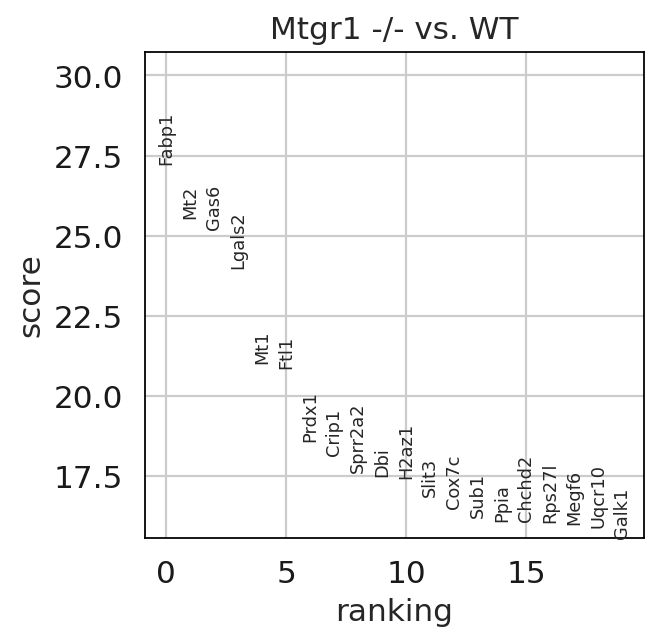

In [80]:
sc.pl.rank_genes_groups( stem, key='stem_DGE' )

In [81]:
sc.tl.rank_genes_groups( stem, groupby='condition',  reference= 'Mtgr1 -/-', use_raw= False, layer='arcsinh', method = 'wilcoxon', key_added='stem_DGE_inverse' , )

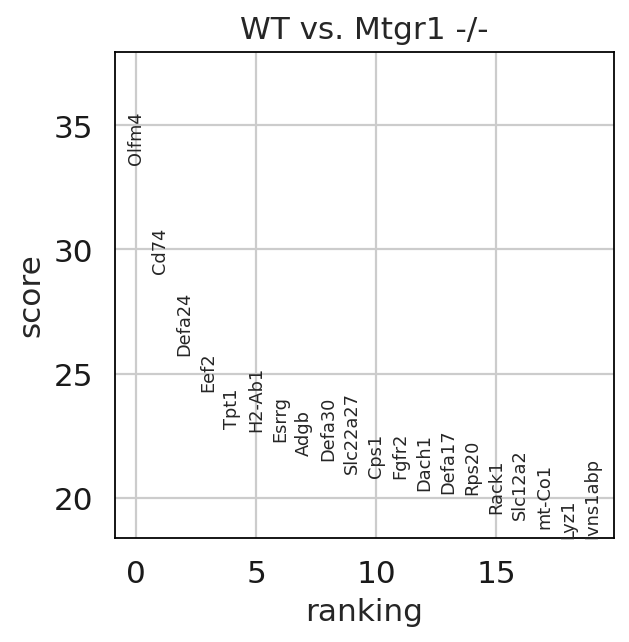

In [82]:
sc.pl.rank_genes_groups( stem, key='stem_DGE_inverse' )

In [83]:
stem.obs['condition'].value_counts()

condition
Mtgr1 -/-    1182
WT            583
Name: count, dtype: int64

In [84]:
stem.obs['sample'].value_counts()

sample
10868_5    668
11283_1    514
10868_1    237
10868_2    194
10868_3    152
Name: count, dtype: int64

In [85]:
stem

AnnData object with n_obs × n_vars = 1765 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'stem_DGE', 'stem_DGE_inverse'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [86]:
mut_rnk_dict = stem.uns['stem_DGE']
wt_rnk_dict = stem.uns['stem_DGE_inverse']

In [87]:
mut_rnk_dict

{'params': {'groupby': 'condition',
  'reference': 'WT',
  'method': 'wilcoxon',
  'use_raw': False,
  'layer': 'arcsinh',
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('Fabp1',), ('Mt2',), ('Gas6',), ..., ('Defa24',), ('Cd74',),
            ('Olfm4',)],
           dtype=[('Mtgr1 -/-', 'O')]),
 'scores': rec.array([( 27.240015,), ( 25.55091 ,), ( 25.192337,), ...,
            (-25.74559 ,), (-29.03845 ,), (-33.448147,)],
           dtype=[('Mtgr1 -/-', '<f4')]),
 'pvals': rec.array([(2.18216666e-163,), (5.36413046e-144,), (4.86033800e-140,),
            ..., (3.61163742e-146,), (2.15295685e-185,),
            (2.73857408e-245,)],
           dtype=[('Mtgr1 -/-', '<f8')]),
 'pvals_adj': rec.array([(1.59007210e-159,), (2.34519784e-140,), (1.77078314e-136,),
            ..., (1.97375985e-142,), (2.35318184e-181,),
            (5.98652293e-241,)],
           dtype=[('Mtgr1 -/-', '<f8')]),
 'logfoldchanges': rec.array([( 3.658665 ,), ( 4.3494787,), ( 4.1985245,), ...,
       

In [88]:
mut_dge_res = zc.parse_rank_gene_group_dict(mut_rnk_dict, fields_to_keep = ['logfoldchanges', 'pvals_adj', 'pvals', 'names', 'scores'], 
                               condition = 'Mtgr1 -/-', sort_by = 'scores', ascending = True)

In [89]:
wt_dge_res = zc.parse_rank_gene_group_dict(wt_rnk_dict, fields_to_keep = ['logfoldchanges', 'pvals_adj', 'pvals', 'names', 'scores'], 
                               condition = 'WT', sort_by = 'scores', ascending = True)

In [90]:
wt_dge_res.head()

,logfoldchanges,pvals_adj,pvals,names,scores
21859,-3.658665,1.590072e-159,2.182167e-163,Fabp1,-27.240015
21858,-4.349479,2.345198e-140,5.364130e-144,Mt2,-25.550911
21857,-4.198524,1.770783e-136,4.860338e-140,Gas6,-25.192337
21856,-1.803808,1.162481e-123,4.254277e-127,Lgals2,-23.982307
21855,-2.181382,7.086279e-95,4.538330e-98,Mt1,-21.017487


In [91]:
mut_dge_res.head()

,logfoldchanges,pvals_adj,pvals,names,scores
21859,-8.520181,5.986523e-241,2.738574e-245,Olfm4,-33.448147
21858,-4.068362,2.353182e-181,2.152957e-185,Cd74,-29.038450
21857,-3.547192,1.973760e-142,3.611637e-146,Defa24,-25.745590
21856,-1.552002,8.738810e-127,2.798338e-130,Eef2,-24.285374
21855,-1.218316,1.338752e-111,5.511789e-115,Tpt1,-22.791941


In [92]:
wt_dge_res.tail()

,logfoldchanges,pvals_adj,pvals,names,scores
4,1.218316,1.338752e-111,5.511789e-115,Tpt1,22.791941
3,1.552002,8.738810e-127,2.798338e-130,Eef2,24.285374
2,3.547192,1.973760e-142,3.611637e-146,Defa24,25.745590
1,4.068362,2.353182e-181,2.152957e-185,Cd74,29.038450
0,8.520181,5.986523e-241,2.738574e-245,Olfm4,33.448147


### GSEA stem

In [6]:
import gseapy as gp

### get gene list:
- filter out gene with > 0.05 adj pvals
- sorted based on logfold changes

In [94]:
mut_dge_res.shape

(21860, 5)

In [95]:
significant_genes = mut_dge_res[mut_dge_res['pvals_adj'] < 0.05 ] 

In [96]:
significant_genes.shape

(2668, 5)

In [97]:
mut_up = significant_genes[significant_genes['logfoldchanges'] > 0 ]

In [98]:
mut_up.sort_values( by= 'pvals_adj', ascending= True, inplace= True)
mut_up.head()

/tmp/ipykernel_262511/2443826550.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mut_up.sort_values( by= 'pvals_adj', ascending= True, inplace= True)


,logfoldchanges,pvals_adj,pvals,names,scores
0,3.658665,1.590072e-159,2.182167e-163,Fabp1,27.240015
1,4.349479,2.345198e-140,5.364130e-144,Mt2,25.550911
2,4.198524,1.770783e-136,4.860338e-140,Gas6,25.192337
3,1.803808,1.162481e-123,4.254277e-127,Lgals2,23.982307
4,2.181382,7.086279e-95,4.538330e-98,Mt1,21.017487


In [99]:
wt_up = significant_genes[significant_genes['logfoldchanges'] < 0 ]

In [100]:
wt_up.sort_values( by= 'pvals_adj', ascending= True, inplace= True)
wt_up.head()

/tmp/ipykernel_262511/222807914.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wt_up.sort_values( by= 'pvals_adj', ascending= True, inplace= True)


,logfoldchanges,pvals_adj,pvals,names,scores
21859,-8.520181,5.986523e-241,2.738574e-245,Olfm4,-33.448147
21858,-4.068362,2.353182e-181,2.152957e-185,Cd74,-29.038450
21857,-3.547192,1.973760e-142,3.611637e-146,Defa24,-25.745590
21856,-1.552002,8.738810e-127,2.798338e-130,Eef2,-24.285374
21855,-1.218316,1.338752e-111,5.511789e-115,Tpt1,-22.791941


In [101]:
wt_up.shape

(619, 5)

In [102]:
mut_up.shape

(2049, 5)

In [103]:
wt_up.head(20)

,logfoldchanges,pvals_adj,pvals,names,scores
21859,-8.520181,5.986523e-241,2.738574e-245,Olfm4,-33.448147
21858,-4.068362,2.353182e-181,2.152957e-185,Cd74,-29.038450
21857,-3.547192,1.973760e-142,3.611637e-146,Defa24,-25.745590
21856,-1.552002,8.738810e-127,2.798338e-130,Eef2,-24.285374
21855,-1.218316,1.338752e-111,5.511789e-115,Tpt1,-22.791941
21854,-4.368322,1.428173e-110,6.533269e-114,H2-Ab1,-22.683405
21853,-2.891311,8.434137e-107,4.244076e-110,Esrrg,-22.293798
21852,-1.365454,3.824687e-101,2.099554e-104,Adgb,-21.698938
21851,-3.346912,2.411491e-99,1.434098e-102,Defa30,-21.503813
21850,-1.594561,1.274952e-94,8.748524e-98,Slc22a27,-20.986307


In [104]:
wt_up = wt_up[ ~wt_up['names'].str.startswith('mt-') ]

In [105]:
wt_up.shape

(609, 5)

In [106]:
wt_up.head(20)

,logfoldchanges,pvals_adj,pvals,names,scores
21859,-8.520181,5.986523e-241,2.738574e-245,Olfm4,-33.448147
21858,-4.068362,2.353182e-181,2.152957e-185,Cd74,-29.038450
21857,-3.547192,1.973760e-142,3.611637e-146,Defa24,-25.745590
21856,-1.552002,8.738810e-127,2.798338e-130,Eef2,-24.285374
21855,-1.218316,1.338752e-111,5.511789e-115,Tpt1,-22.791941
21854,-4.368322,1.428173e-110,6.533269e-114,H2-Ab1,-22.683405
21853,-2.891311,8.434137e-107,4.244076e-110,Esrrg,-22.293798
21852,-1.365454,3.824687e-101,2.099554e-104,Adgb,-21.698938
21851,-3.346912,2.411491e-99,1.434098e-102,Defa30,-21.503813
21850,-1.594561,1.274952e-94,8.748524e-98,Slc22a27,-20.986307


### Enrichment 

In [107]:
gs = [ 'GO_Biological_Process_2023', 'WikiPathways_2019_Mouse', 'KEGG_2019_Mouse']

In [108]:
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr_mut_up = gp.enrichr(gene_list=mut_up['names'].iloc[0:min(500, mut_up.shape[0])], # or "./tests/data/gene_list.txt",
                 gene_sets=gs,
                 organism='mouse', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [109]:
enr_wt_up = gp.enrichr(gene_list=wt_up['names'].iloc[0:min(500, wt_up.shape[0])], # or "./tests/data/gene_list.txt",
                 gene_sets=gs,
                 organism='mouse', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [110]:
enr_mut_up.results['Gene_set'].unique()

array(['GO_Biological_Process_2023', 'WikiPathways_2019_Mouse',
       'KEGG_2019_Mouse'], dtype=object)

In [111]:
enr_mut_up.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Translation (GO:0006412),52/234,2.439778e-34,4.991785e-31,0,0,12.320153,953.530398,MRPS16;MRPS14;MRPS12;MRPL36;MRPL34;RPL7;MRPL33...
1,GO_Biological_Process_2023,Peptide Biosynthetic Process (GO:0043043),38/158,1.103444e-26,1.128823e-23,0,0,13.283550,793.941520,MRPS16;RPL10;MRPS14;MRPL18;MRPS33;MRPS12;RPL11...
2,GO_Biological_Process_2023,Macromolecule Biosynthetic Process (GO:0009059),39/183,2.990670e-25,2.039637e-22,0,0,11.371475,642.137303,MRPS16;RPL10;MRPS14;MRPL18;MRPS33;MRPS12;RPL11...
3,GO_Biological_Process_2023,Mitochondrial Translation (GO:0032543),30/98,1.088503e-24,5.567694e-22,0,0,18.240300,1006.449408,MRPS16;MRPS14;MRPL18;MRPS33;MRPS12;MRPL17;MRPL...
4,GO_Biological_Process_2023,Mitochondrial ATP Synthesis Coupled Electron T...,26/70,4.698709e-24,1.922712e-21,0,0,24.254699,1302.835197,NDUFB8;NDUFB7;NDUFB6;UQCRB;NDUFA12;NDUFB4;COX7...


### investigate why both WT and Mut has updated TNF-alpha pathway
- different genes from the 2 coditions in the same pathway are upregulated

In [52]:
mut_up_wiki = enr_mut_up.results[enr_mut_up.results['Gene_set'] == 'WikiPathways_2019_Mouse']

In [53]:
mut_up_wiki.columns

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')

In [55]:
mut_up_wiki[mut_up_wiki['Term'].str.startswith("TNF") ]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
2077,WikiPathways_2019_Mouse,TNF-alpha NF-kB Signaling Pathway WP246,7/187,0.188851,0.525241,0,0,1.524003,2.540207,HSP90AA1;UBE2I;PSMB5;SUMO1;PSMC3;PSMC2;RPS11


In [56]:
wt_up_wiki = enr_wt_up.results[enr_wt_up.results['Gene_set'] == 'WikiPathways_2019_Mouse']

In [57]:
wt_up_wiki[wt_up_wiki['Term'].str.startswith("TNF") ]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
2444,WikiPathways_2019_Mouse,TNF-alpha NF-kB Signaling Pathway WP246,14/187,0.000268,0.011269,0,0,3.218178,26.464221,RPL4;RPL30;SMARCC1;CREBBP;HSP90AB1;STAT1;RPL8;...


### visualization

In [87]:
sn.color_palette("Set2", len(gs)).as_hex()

['#66c2a5', '#fc8d62', '#8da0cb']

In [88]:
clr = sn.color_palette("Set2", len(gs)).as_hex()

In [89]:
color_dict = dict( zip(gs,clr  ))

In [90]:
color_dict

{'GO_Biological_Process_2023': '#66c2a5',
 'WikiPathways_2019_Mouse': '#fc8d62',
 'KEGG_2019_Mouse': '#8da0cb'}

In [116]:
t5_mut_enr_ls = []

In [117]:
for i in range(len( gs)):
    
    er = gp.enrichr(gene_list=mut_up['names'], # or "./tests/data/gene_list.txt",
                     gene_sets=[gs[i]],
                     organism='mouse', # don't forget to set organism to the one you desired! e.g. Yeast
                     outdir=None, # don't write to disk
                    )
    t5_mut_enr_ls.append( er)

In [118]:
t5_wt_enr_ls = []

In [119]:
for i in range(len( gs)):
    
    er = gp.enrichr(gene_list=wt_up['names'], # or "./tests/data/gene_list.txt",
                     gene_sets=[gs[i]],
                     organism='mouse', # don't forget to set organism to the one you desired! e.g. Yeast
                     outdir=None, # don't write to disk
                    )
    t5_wt_enr_ls.append( er)

#### read in already saved versions

In [129]:
enr_mut_up.to_csv("./enrichment_result_mut_up.csv", header = True, index = True)

In [130]:
enr_wt_up.to_csv("./enrichment_result_wt_up.csv", header = True, index = True)

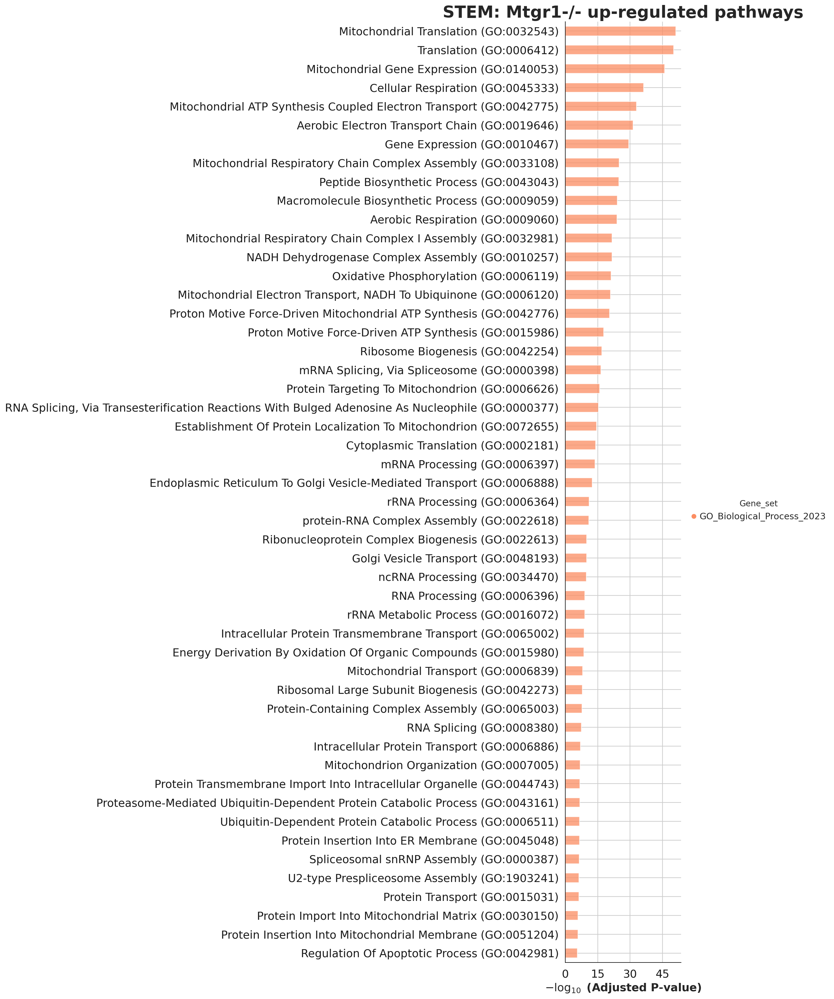

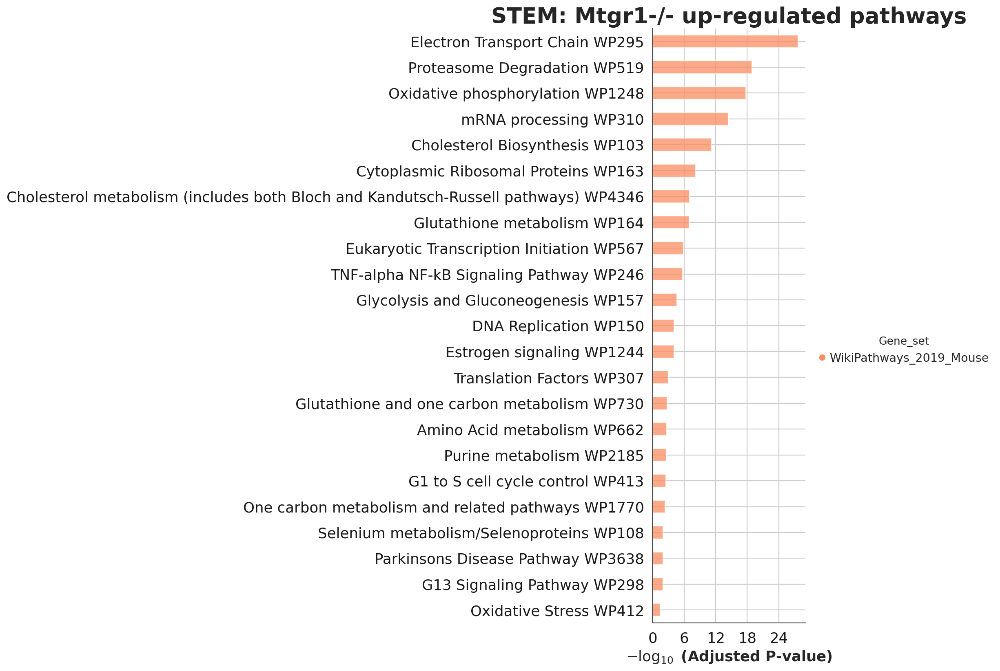

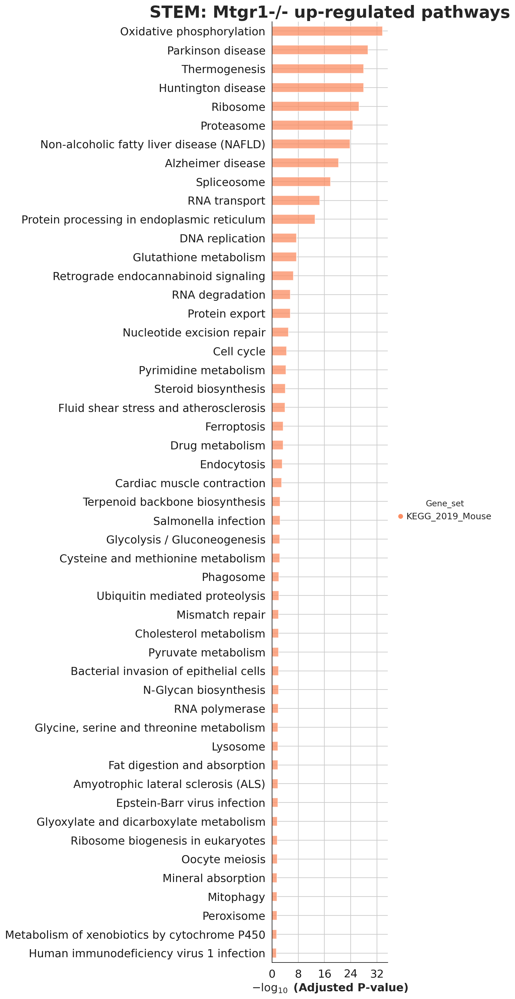

In [95]:
for er in t5_mut_enr_ls:
    significant_term = er.results[ er.results['Adjusted P-value'] < 0.05 ]
    num_terms = min( 50, significant_term.shape[0] )
    x = gp.barplot(er.results,
                   title = 'STEM: Mtgr1-/- up-regulated pathways', 
                  column="Adjusted P-value",
                  group='Gene_set', # set group, so you could do a multi-sample/library comparsion
                  size=10,
                  top_term=50,
                  figsize=(3,round( 0.5 * num_terms) ),
                   color = clr[1]
                  #color=['darkred', 'darkblue'] # set colors for group
                  #color = {'KEGG_2021_Human': 'salmon', 'MSigDB_Hallmark_2020':'darkblue'}
                 )

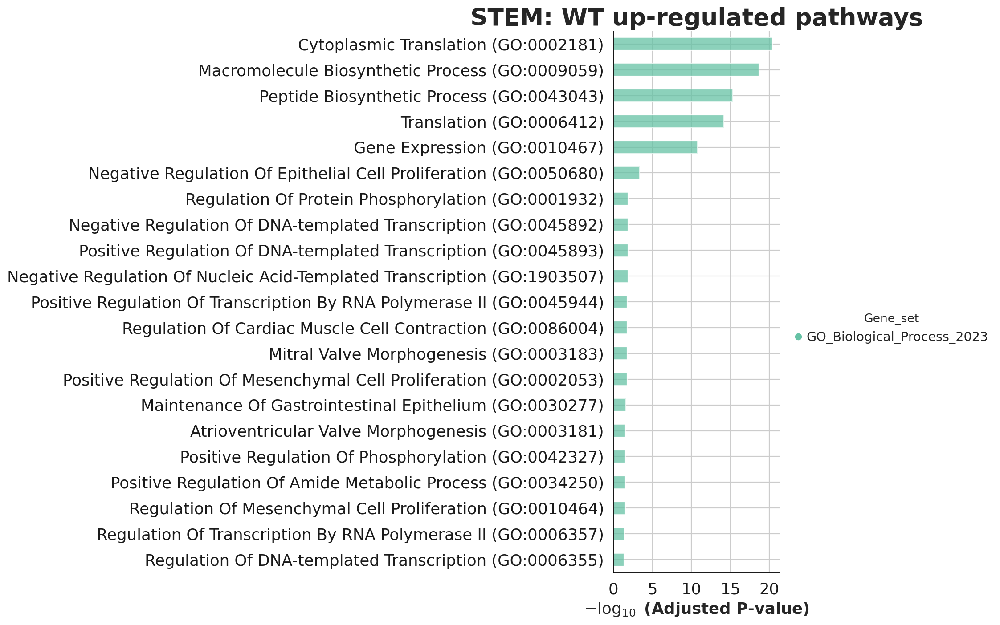

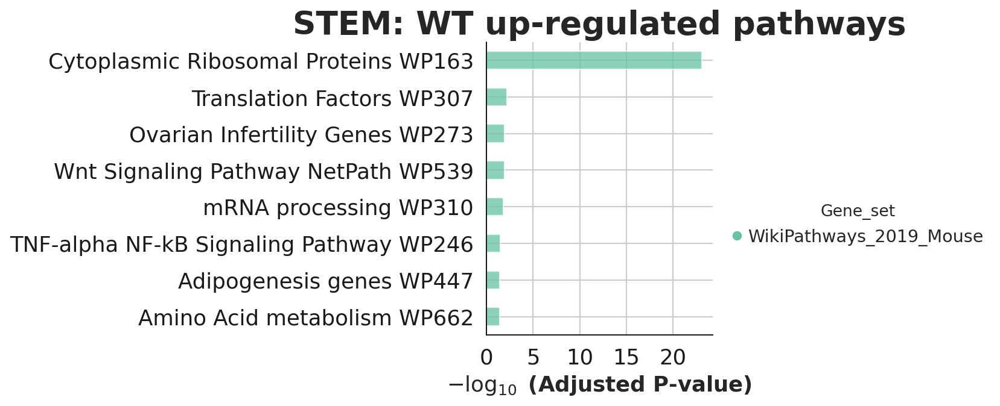

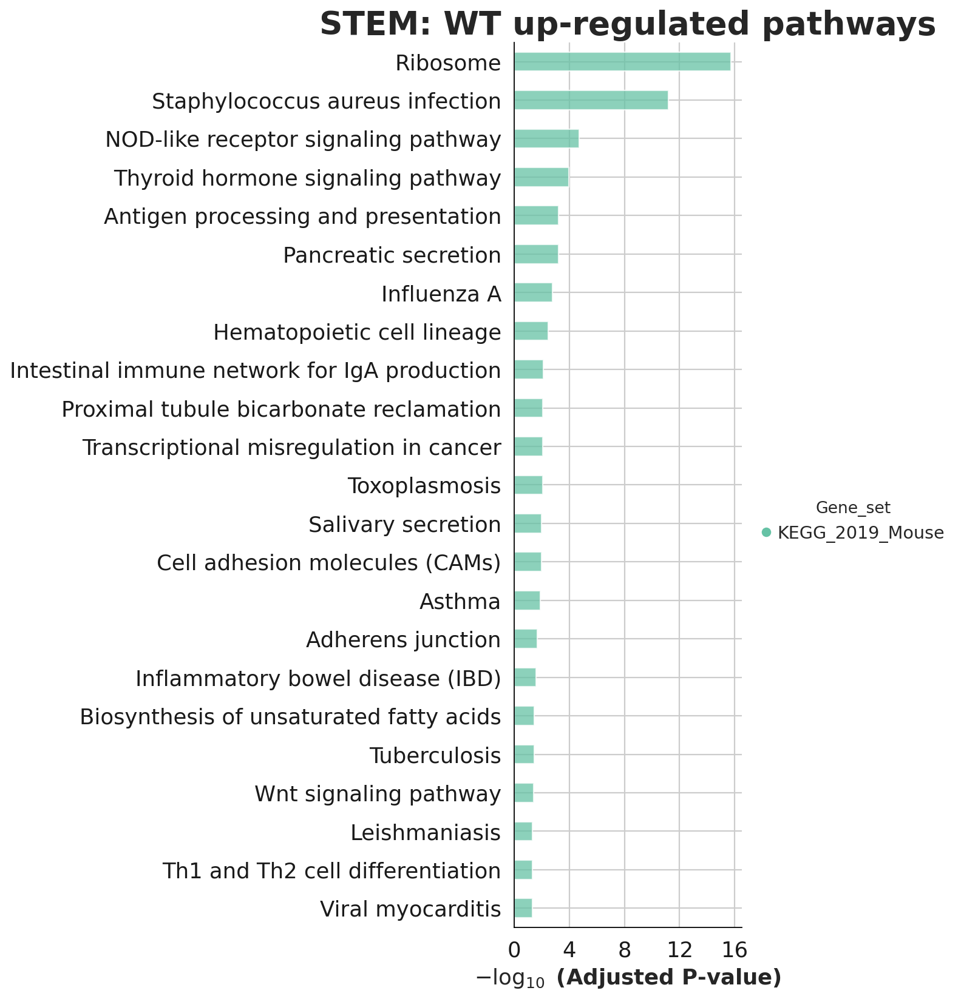

In [96]:
for er in t5_wt_enr_ls:
    significant_term = er.results[ er.results['Adjusted P-value'] < 0.05 ]
    num_terms = min( 50, significant_term.shape[0] )
    x = gp.barplot(er.results,
                   title = 'STEM: WT up-regulated pathways', 
                  column="Adjusted P-value",
                  group='Gene_set', # set group, so you could do a multi-sample/library comparsion
                  size=10,
                  top_term=50,
                  figsize=(3,round( 0.5 * num_terms) ),
                   color = clr[0]
                  #color=['darkred', 'darkblue'] # set colors for group
                  #color = {'KEGG_2021_Human': 'salmon', 'MSigDB_Hallmark_2020':'darkblue'}
                 )

### visualization final: get selected pathway bar plot

In [132]:
wt_wiki_up = t5_wt_enr_ls[1]
wt_wiki_up.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,WikiPathways_2019_Mouse,Cytoplasmic Ribosomal Proteins WP163,32/92,1.374949e-25,1.787434e-23,0,0,17.868053,1022.878331,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
1,WikiPathways_2019_Mouse,Wnt Signaling Pathway NetPath WP539,12/108,1.109089e-04,5.311027e-03,0,0,4.039992,36.791402,DLG1;CAMK2D;FRAT2;CCND1;CSNK1A1;MYB;CTNNB1;ARR...
2,WikiPathways_2019_Mouse,Translation Factors WP307,8/50,1.225622e-04,5.311027e-03,0,0,6.132319,55.233138,EEF1B2;EEF1A1;EEF1D;EIF2S3X;EIF3E;EIF3F;EEF2;E...
3,WikiPathways_2019_Mouse,Ovarian Infertility Genes WP273,6/31,2.989685e-04,9.716475e-03,0,0,7.707861,62.550619,CEBPB;NCOR1;VDR;NRIP1;PRLR;SYNE2
4,WikiPathways_2019_Mouse,Adipogenesis genes WP447,12/134,8.206343e-04,2.133649e-02,0,0,3.174726,22.557804,NCOA1;BMP3;CEBPB;NCOR1;KLF5;STAT1;NRIP1;CTNNB1...


In [133]:
wt_wiki_up.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,WikiPathways_2019_Mouse,Cytoplasmic Ribosomal Proteins WP163,32/92,1.374949e-25,1.787434e-23,0,0,17.868053,1022.878331,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
1,WikiPathways_2019_Mouse,Wnt Signaling Pathway NetPath WP539,12/108,1.109089e-04,5.311027e-03,0,0,4.039992,36.791402,DLG1;CAMK2D;FRAT2;CCND1;CSNK1A1;MYB;CTNNB1;ARR...
2,WikiPathways_2019_Mouse,Translation Factors WP307,8/50,1.225622e-04,5.311027e-03,0,0,6.132319,55.233138,EEF1B2;EEF1A1;EEF1D;EIF2S3X;EIF3E;EIF3F;EEF2;E...
3,WikiPathways_2019_Mouse,Ovarian Infertility Genes WP273,6/31,2.989685e-04,9.716475e-03,0,0,7.707861,62.550619,CEBPB;NCOR1;VDR;NRIP1;PRLR;SYNE2
4,WikiPathways_2019_Mouse,Adipogenesis genes WP447,12/134,8.206343e-04,2.133649e-02,0,0,3.174726,22.557804,NCOA1;BMP3;CEBPB;NCOR1;KLF5;STAT1;NRIP1;CTNNB1...
5,WikiPathways_2019_Mouse,Primary Focal Segmental Glomerulosclerosis FSG...,8/72,1.522252e-03,2.948304e-02,0,0,4.019759,26.078443,NOTCH1;DAG1;PLCE1;COL4A5;CTNNB1;IRF6;UTRN;PTK2
6,WikiPathways_2019_Mouse,mRNA processing WP310,26/457,1.804227e-03,2.948304e-02,0,0,1.961850,12.394231,DDX5;RBM25;RBM47;RBM26;RPL32;RPL12;MSI2;RPL8;R...
7,WikiPathways_2019_Mouse,TNF-alpha NF-kB Signaling Pathway WP246,14/187,1.814341e-03,2.948304e-02,0,0,2.613805,16.498422,RPL4;RPL30;SMARCC1;CREBBP;HSP90AB1;STAT1;RPL8;...
8,WikiPathways_2019_Mouse,Amino Acid metabolism WP662,9/95,2.435348e-03,3.517725e-02,0,0,3.367151,20.262390,DDC;OAT;PDHA1;CPS1;HMGCS2;ACAA1A;GLS;OTC;FARSB
9,WikiPathways_2019_Mouse,Exercise-induced Circadian Regulation WP544,6/49,3.575674e-03,4.648376e-02,0,0,4.477149,25.222475,SF3A3;PURA;HSPA8;CEBPB;H2-DMA;ETV6


In [135]:
to_plot_wt = wt_wiki_up.results.loc[[0,2,1,6,8], :]
to_plot_wt

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,WikiPathways_2019_Mouse,Cytoplasmic Ribosomal Proteins WP163,32/92,1.374949e-25,1.787434e-23,0,0,17.868053,1022.878331,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
2,WikiPathways_2019_Mouse,Translation Factors WP307,8/50,1.225622e-04,5.311027e-03,0,0,6.132319,55.233138,EEF1B2;EEF1A1;EEF1D;EIF2S3X;EIF3E;EIF3F;EEF2;E...
1,WikiPathways_2019_Mouse,Wnt Signaling Pathway NetPath WP539,12/108,1.109089e-04,5.311027e-03,0,0,4.039992,36.791402,DLG1;CAMK2D;FRAT2;CCND1;CSNK1A1;MYB;CTNNB1;ARR...
6,WikiPathways_2019_Mouse,mRNA processing WP310,26/457,1.804227e-03,2.948304e-02,0,0,1.961850,12.394231,DDX5;RBM25;RBM47;RBM26;RPL32;RPL12;MSI2;RPL8;R...
8,WikiPathways_2019_Mouse,Amino Acid metabolism WP662,9/95,2.435348e-03,3.517725e-02,0,0,3.367151,20.262390,DDC;OAT;PDHA1;CPS1;HMGCS2;ACAA1A;GLS;OTC;FARSB


In [137]:
list( to_plot_wt['Term'] )

['Cytoplasmic Ribosomal Proteins WP163',
 'Translation Factors WP307',
 'Wnt Signaling Pathway NetPath WP539',
 'mRNA processing WP310',
 'Amino Acid metabolism WP662']

In [138]:
wt_term2 = ['Cytoplasmic Ribosomal Proteins',
 'Translation Factors',
 'Wnt Signaling Pathway NetPath',
 'mRNA processing',
 'Amino Acid metabolism']

In [139]:
to_plot_wt['Term'] = wt_term2

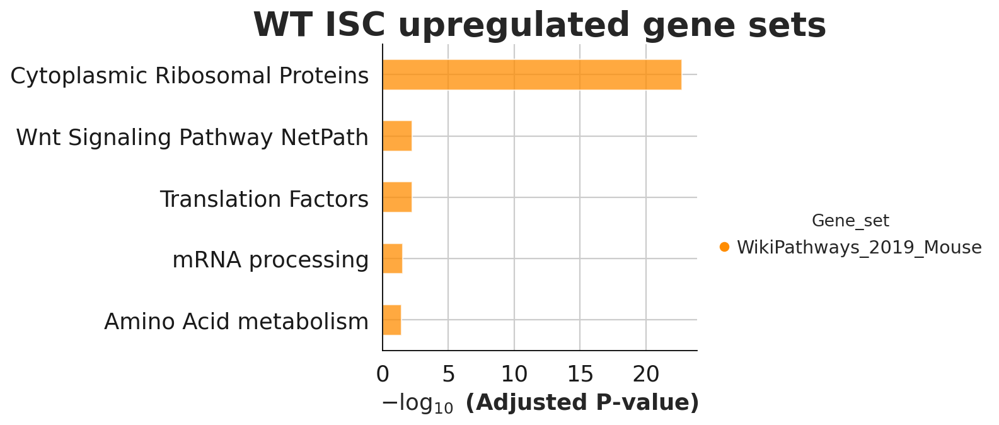

In [165]:
x = gp.barplot(to_plot_wt,
                   title = 'WT ISC upregulated gene sets', 
                  column="Adjusted P-value",
                  group='Gene_set', # set group, so you could do a multi-sample/library comparsion
                  figsize=(4, 5*0.8),
                   color = 'darkorange'
                  #color=['darkred', 'darkblue'] # set colors for group
                  #color = {'KEGG_2021_Human': 'salmon', 'MSigDB_Hallmark_2020':'darkblue'}
                 )

In [148]:
mut_wiki_up = t5_mut_enr_ls[1]
mut_wiki_up.results[0:20]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,WikiPathways_2019_Mouse,Electron Transport Chain WP295,58/103,6.577348e-31,9.471381e-29,0,0,11.591584,805.574614,COX7B;NDUFA12;NDUFA10;ATP5G3;COX6A1;UQCRFS1;CO...
1,WikiPathways_2019_Mouse,Proteasome Degradation WP519,34/52,1.184110e-21,8.525595e-20,0,0,16.810642,810.025767,PSMD12;PSMD11;PSMD13;UBE2D3;RPN1;PSMA7;PSMD8;P...
2,WikiPathways_2019_Mouse,Oxidative phosphorylation WP1248,36/62,2.592365e-20,1.244335e-18,0,0,12.329474,556.048557,NDUFB9;NDUFB8;NDUFB7;NDUFA11;NDUFB6;NDUFB10;ND...
3,WikiPathways_2019_Mouse,mRNA processing WP310,108/457,4.600771e-17,1.656277e-15,0,0,2.806305,105.566789,SRP19;EIF4A3;PARK7;SRP14;RPL9;RPL7;RDM1;SNRPD2...
4,WikiPathways_2019_Mouse,Cholesterol Biosynthesis WP103,14/15,1.829611e-13,5.269280e-12,0,0,123.488943,3621.869303,FDPS;IDI1;HMGCS1;MSMO1;HMGCR;LSS;CYP51;SQLE;NS...
5,WikiPathways_2019_Mouse,Cytoplasmic Ribosomal Proteins WP163,32/92,2.065600e-10,4.957440e-09,0,0,4.730722,105.497141,RPL10;RPL34;RPL11;RPL9;RPL6;RPL7;RPL7A;RPS17;R...
6,WikiPathways_2019_Mouse,Cholesterol metabolism (includes both Bloch an...,21/49,3.437838e-09,7.072125e-08,0,0,6.628328,129.175667,SREBF1;IDI1;FDPS;HMGCS1;NR1H3;MSMO1;DHCR24;ACS...
7,WikiPathways_2019_Mouse,Glutathione metabolism WP164,13/20,5.122872e-09,9.221169e-08,0,0,16.367668,312.451421,GPX2;GPX1;GPX4;IDH1;GSS;GSTT2;GSTT1;GCLC;GM377...
8,WikiPathways_2019_Mouse,Eukaryotic Transcription Initiation WP567,17/43,4.382680e-07,7.012289e-06,0,0,5.767811,84.443266,GTF2A2;TAF12;CCNH;TAF13;GTF2B;TAF9;ILK;AK6;CDK...
9,WikiPathways_2019_Mouse,Glycolysis and Gluconeogenesis WP157,18/51,1.450130e-06,2.088188e-05,0,0,4.812139,64.693711,GOT1;MDH1;MDH2;PGAM1;ENO1B;SLC2A1;ENO1;HK2;LDH...


In [153]:
mut_wiki_up.results[mut_wiki_up.results['Term'].str.startswith( 'Oxidative') ]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
2,WikiPathways_2019_Mouse,Oxidative phosphorylation WP1248,36/62,2.592365e-20,1.244335e-18,0,0,12.329474,556.048557,NDUFB9;NDUFB8;NDUFB7;NDUFA11;NDUFB6;NDUFB10;ND...
22,WikiPathways_2019_Mouse,Oxidative Stress WP412,8/28,5.700237e-03,3.568844e-02,0,0,3.514160,18.158533,GCLC;GPX1;UGT1A1;GSTT2;CYBA;MT1;SOD2;TXN2
35,WikiPathways_2019_Mouse,Oxidative Damage WP1496,8/42,6.040717e-02,2.381686e-01,0,0,2.065539,5.797239,CDC42;PCNA;APAF1;BAD;CASP3;TNK2;CYCS;MAPK13


In [154]:
to_plot_mut = mut_wiki_up.results.loc[[0,1,2,3,4,9,11,17,13,15,18,22], :]
to_plot_mut

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,WikiPathways_2019_Mouse,Electron Transport Chain WP295,58/103,6.577348e-31,9.471381e-29,0,0,11.591584,805.574614,COX7B;NDUFA12;NDUFA10;ATP5G3;COX6A1;UQCRFS1;CO...
1,WikiPathways_2019_Mouse,Proteasome Degradation WP519,34/52,1.184110e-21,8.525595e-20,0,0,16.810642,810.025767,PSMD12;PSMD11;PSMD13;UBE2D3;RPN1;PSMA7;PSMD8;P...
2,WikiPathways_2019_Mouse,Oxidative phosphorylation WP1248,36/62,2.592365e-20,1.244335e-18,0,0,12.329474,556.048557,NDUFB9;NDUFB8;NDUFB7;NDUFA11;NDUFB6;NDUFB10;ND...
3,WikiPathways_2019_Mouse,mRNA processing WP310,108/457,4.600771e-17,1.656277e-15,0,0,2.806305,105.566789,SRP19;EIF4A3;PARK7;SRP14;RPL9;RPL7;RDM1;SNRPD2...
4,WikiPathways_2019_Mouse,Cholesterol Biosynthesis WP103,14/15,1.829611e-13,5.269280e-12,0,0,123.488943,3621.869303,FDPS;IDI1;HMGCS1;MSMO1;HMGCR;LSS;CYP51;SQLE;NS...
9,WikiPathways_2019_Mouse,Glycolysis and Gluconeogenesis WP157,18/51,1.450130e-06,2.088188e-05,0,0,4.812139,64.693711,GOT1;MDH1;MDH2;PGAM1;ENO1B;SLC2A1;ENO1;HK2;LDH...
11,WikiPathways_2019_Mouse,DNA Replication WP150,14/41,3.261830e-05,3.914196e-04,0,0,4.567040,47.180430,RFC5;RFC3;PCNA;RFC4;MCM7;GMNN;RPA1;RPA2;ORC6;R...
17,WikiPathways_2019_Mouse,Glutathione and one carbon metabolism WP730,10/31,7.315015e-04,5.852012e-03,0,0,4.187393,30.234703,GPX2;GCLC;GPX1;GPX4;SHMT2;ANPEP;IDH1;GSS;G6PDX...
13,WikiPathways_2019_Mouse,Amino Acid metabolism WP662,22/95,1.944787e-04,2.000352e-03,0,0,2.658061,22.713634,GOT1;MDH1;MDH2;GSS;IDH1;CAD;ODC1;EPRS;FH1;ADH5...
15,WikiPathways_2019_Mouse,Purine metabolism WP2185,33/171,2.606657e-04,2.345992e-03,0,0,2.112912,17.436323,TAF9;AK2;ADK;NUDT5;AK6;NT5C2;GUK1;POLR2C;POLR2...


In [155]:
to_plot_mut.shape

(12, 10)

In [158]:
term2 = list( to_plot_mut['Term'] )

In [160]:
term2b = [" ".join( t.split(' ')[0:-1] ) for t in term2]
term2b

['Electron Transport Chain',
 'Proteasome Degradation',
 'Oxidative phosphorylation',
 'mRNA processing',
 'Cholesterol Biosynthesis',
 'Glycolysis and Gluconeogenesis',
 'DNA Replication',
 'Glutathione and one carbon metabolism',
 'Amino Acid metabolism',
 'Purine metabolism',
 'G1 to S cell cycle control',
 'Oxidative Stress']

In [161]:
to_plot_mut['Term'] = term2b

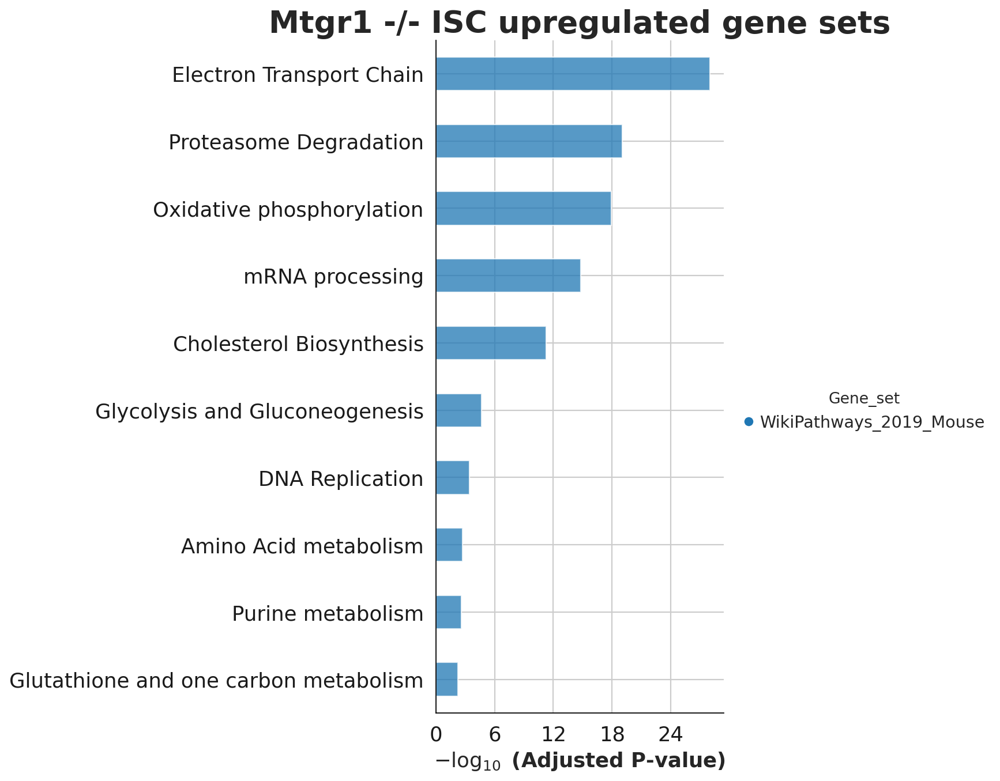

In [173]:
x = gp.barplot(to_plot_mut,
                   title = 'Mtgr1 -/- ISC upregulated gene sets', 
                  column="Adjusted P-value",
                  group='Gene_set', # set group, so you could do a multi-sample/library comparsion
                  figsize=(4, 12*0.8),
                   color = '#1f77b4'
                  #color=['darkred', 'darkblue'] # set colors for group
                  #color = {'KEGG_2021_Human': 'salmon', 'MSigDB_Hallmark_2020':'darkblue'}
                 )

## violin plot for ABS cells

In [174]:
brush_border_marker = pd.read_csv("./selected_brush_border_genes.csv", header = None, index_col = None)
brush_border_marker.head()

,0
0,Actb
1,Plec
2,Vil1
3,Pls1
4,Ezr


In [121]:
#comb_sub.X = comb_sub.raw.X

In [161]:
dat_subsample.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [162]:
ab = dat_subsample[dat_subsample.obs['cell_type'] == 'ABS' ]

In [163]:
ab

View of AnnData object with n_obs × n_vars = 3788 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'treatment_colors', 'sample_colors', 'cell_type_colors', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts', 'full_norm'
    obsp: 'distances', 'connectivities'

In [164]:
ab.X.sum(axis = 1)

matrix([[6964.],
        [4822.],
        [7927.],
        ...,
        [ 890.],
        [ 894.],
        [ 882.]], dtype=float32)

In [165]:
ab.raw = ab.copy()

In [166]:
ab.X= ab.layers['arcsinh']

In [167]:
brush_border_df = ab.to_df( )[brush_border_marker[0]]

In [168]:
brush_border_df.head(2)

Genes,Actb,Plec,Vil1,Pls1,Ezr,Krt20,Dsp,Sptan1,Actn4,Sptbn1,...,Eps8l3,Eps8,Actr3,Flnb,Cobl,Tprn,Cap1,Baiap2l1,Cdhr2,Cdhr5
Cells,,,,,,,,,,,,,,,,,,,,,
CAGGACAGATTAAAGG_10868_3,2.660157,0.0,0.800883,0.800883,0.0,1.339989,0.0,0.000000,0.800883,1.339989,...,0.800883,0.00000,0.000000,0.800883,0.800883,0.0,0.000000,0.0,0.800883,0.800883
ACAGAAGCCCAACCCA_10868_3,3.509223,0.0,0.000000,1.068856,0.0,1.068856,0.0,1.068856,1.068856,0.000000,...,1.068856,2.05842,1.672427,1.068856,0.000000,0.0,1.068856,0.0,1.672427,0.000000


In [169]:
len( brush_border_df.columns )

22

In [170]:
df2 = pd.DataFrame()
for c in range( len( brush_border_df.columns) ):
    scaled_df = zc.scale_column( brush_border_df, brush_border_df.columns[c], "scaled_"+ brush_border_df.columns[c] )
    df2[brush_border_df.columns[c] ] = scaled_df[ "scaled_"+ brush_border_df.columns[c] ]

In [171]:
df2.head()

,Actb,Plec,Vil1,Pls1,Ezr,Krt20,Dsp,Sptan1,Actn4,Sptbn1,...,Eps8l3,Eps8,Actr3,Flnb,Cobl,Tprn,Cap1,Baiap2l1,Cdhr2,Cdhr5
Cells,,,,,,,,,,,,,,,,,,,,,
CAGGACAGATTAAAGG_10868_3,0.443420,0.0,0.162557,0.168744,0.000000,0.260000,0.000000,0.000000,0.183253,0.425964,...,0.201929,0.000000,0.000000,0.188765,0.232549,0.0,0.000000,0.0,0.191524,0.192871
ACAGAAGCCCAACCCA_10868_3,0.584951,0.0,0.000000,0.225206,0.000000,0.207392,0.000000,0.335101,0.244569,0.000000,...,0.269494,0.566057,0.462009,0.251925,0.000000,0.0,0.334280,0.0,0.399946,0.000000
AGCGCACTAATCACGG_10868_3,0.441483,0.0,0.456533,0.000000,0.468401,0.139307,0.000000,0.000000,0.424966,0.000000,...,0.181022,0.000000,0.000000,0.169221,0.000000,0.0,0.384347,0.0,0.293891,0.000000
AATAATCCACTAACAA_10868_1,0.762171,0.0,0.507352,0.000000,0.000000,0.618514,0.000000,0.000000,0.000000,0.000000,...,0.630236,0.000000,0.000000,0.000000,0.725804,0.0,0.000000,0.0,0.762310,0.601965
ATGTCCGAAAGCAAAG_10868_2,0.523597,0.0,0.334034,0.000000,0.148616,0.268705,0.073093,0.000000,0.482380,0.265551,...,0.077440,0.229722,0.162788,0.000000,0.000000,0.0,0.184294,0.0,0.250217,0.333505


In [172]:
#max(df2['Actb'])

In [173]:
df2['condition'] = ab.obs['condition'] 

In [174]:
brush_border_df['condition'] = ab.obs['condition'] 

In [195]:
ab.uns['treatment_colors']

array(['#1f77b4', '#ff7f0e'], dtype='<U7')

In [175]:
#sc.pl.umap( ab, color = 'condition')

In [176]:
#ab

In [177]:
new_brush_genes = df2.columns[0:-1]

In [178]:
new_brush_genes

Index(['Actb', 'Plec', 'Vil1', 'Pls1', 'Ezr', 'Krt20', 'Dsp', 'Sptan1',
       'Actn4', 'Sptbn1', 'Cltc', 'Ctnna1', 'Eps8l3', 'Eps8', 'Actr3', 'Flnb',
       'Cobl', 'Tprn', 'Cap1', 'Baiap2l1', 'Cdhr2', 'Cdhr5'],
      dtype='object')

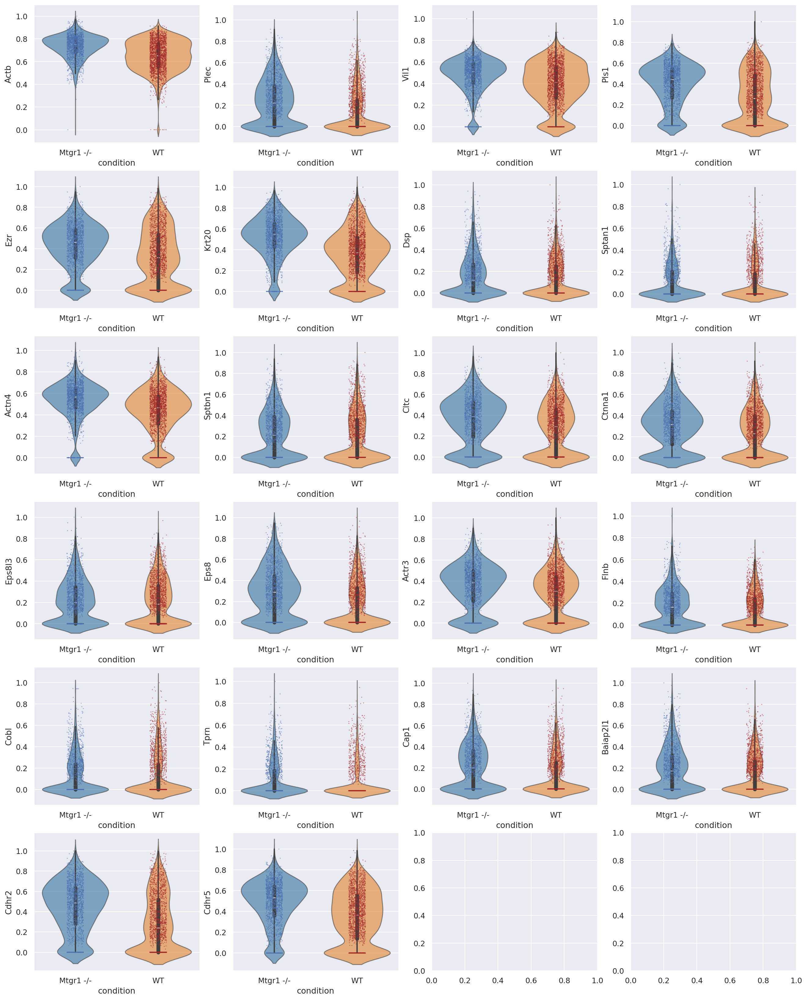

In [191]:
f,axs = plt.subplots( nrows=6, ncols=4, figsize = [20, 26])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( len( new_brush_genes) ):
    c = new_brush_genes[i]
    
    sn.violinplot( data = df2,  x = 'condition', y = c, 
               palette=list( ab.uns['treatment_colors']), hue = 'condition',
              ax = axs[i], alpha = 0.6)
    sn.stripplot( data = df2,  x = 'condition', y = c, 
              palette = ['b', 'brown'], hue = 'condition',
              ax = axs[i], size = 1.5, alpha = 0.5)
    axs[i].set( ylabel= c)


### get the gene score

In [175]:
dat = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [7]:
ab = dat[dat.obs['cell_type'] == 'ABS']

In [8]:
ab

View of AnnData object with n_obs × n_vars = 3729 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [9]:
ab.raw = ab.copy()

In [10]:
zc.normalization( ab)

AnnData object with n_obs × n_vars = 3729 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [11]:
#ab.X = ab.layers['full_norm']

In [16]:
ab.layers['full_norm'] = ab.X.copy()

In [14]:
sc.tl.score_genes( ab, gene_list=brush_border_marker[0], ctrl_size=100, score_name='brush_border_score', use_raw = False )

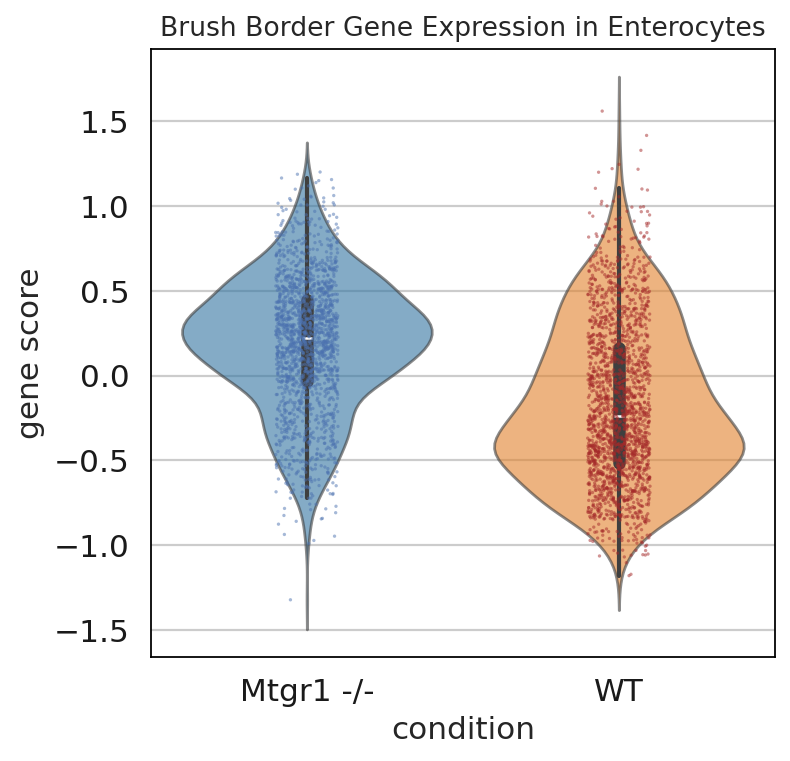

In [15]:
f,score_ax = plt.subplots( figsize = [5,5])
sn.set(font_scale=1)


    
sn.violinplot( data = ab.obs,  x = 'condition', y = 'brush_border_score', 
           palette=list( ab.uns['treatment_colors']), hue = 'condition',
          ax =score_ax, alpha = 0.6)
sn.stripplot( data = ab.obs,  x = 'condition', y = 'brush_border_score', 
          palette = ['b', 'brown'], hue = 'condition',
          ax = score_ax, size = 1.5, alpha = 0.5)
score_ax.set( ylabel= 'gene score')
t = score_ax.set( title= 'Brush Border Gene Expression in Enterocytes')

In [17]:
ab.X = ab.layers['arcsinh']

In [18]:
sc.tl.score_genes( ab, gene_list=brush_border_marker[0], ctrl_size=100, score_name='brush_border_score_arcsinh', use_raw = False,  )

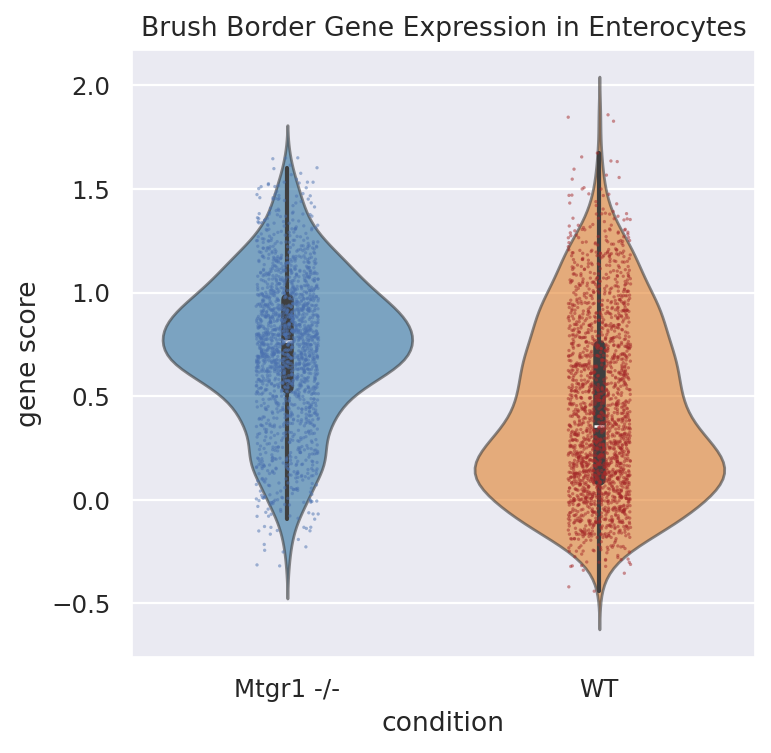

In [19]:
f,score_ax = plt.subplots( figsize = [5,5])
sn.set(font_scale=1)


    
sn.violinplot( data = ab.obs,  x = 'condition', y = 'brush_border_score_arcsinh', 
           palette=list( ab.uns['treatment_colors']), hue = 'condition',
          ax =score_ax, alpha = 0.6)
sn.stripplot( data = ab.obs,  x = 'condition', y = 'brush_border_score_arcsinh', 
          palette = ['b', 'brown'], hue = 'condition',
          ax = score_ax, size = 1.5, alpha = 0.5)
score_ax.set( ylabel= 'gene score')
t = score_ax.set( title= 'Brush Border Gene Expression in Enterocytes')

## Get Brush Border Score for stem cell and TACs

In [175]:
dat = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [176]:
stem = dat[dat.obs['cell_type'] == 'STM']

In [178]:
#stem.X.sum(axis = 1)

In [179]:
stem.raw = stem.copy()

In [181]:
zc.normalization(stem)

AnnData object with n_obs × n_vars = 1765 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [182]:
stem.X = stem.layers['arcsinh']

In [183]:
sc.tl.score_genes( stem, gene_list=brush_border_marker[0], ctrl_size=100, score_name='brush_border_score_arcsinh', use_raw = False,  )

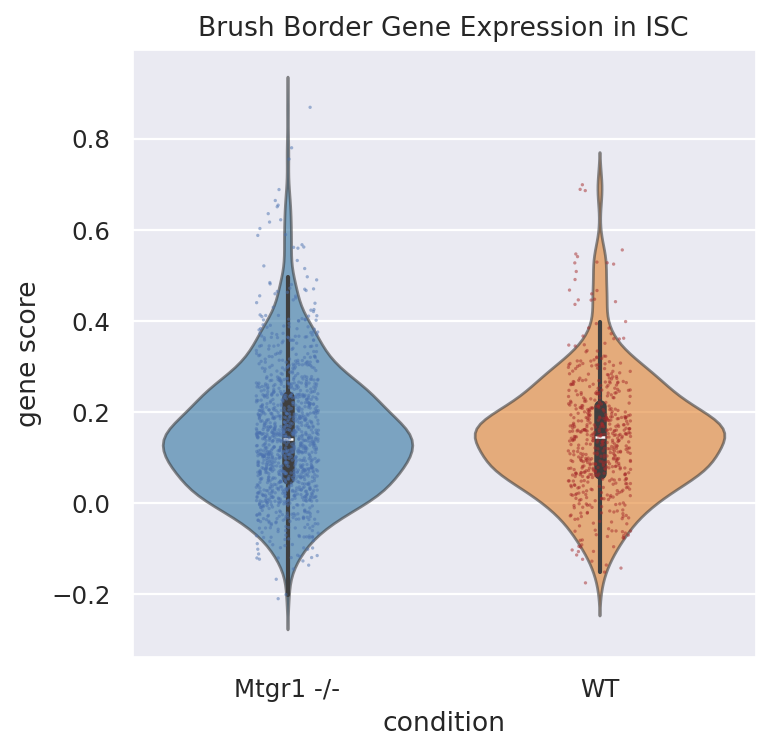

In [185]:
f,score_ax = plt.subplots( figsize = [5,5])
sn.set(font_scale=1)


    
sn.violinplot( data = stem.obs,  x = 'condition', y = 'brush_border_score_arcsinh', 
           palette=list( stem.uns['treatment_colors']), hue = 'condition',
          ax =score_ax, alpha = 0.6)
sn.stripplot( data = stem.obs,  x = 'condition', y = 'brush_border_score_arcsinh', 
          palette = ['b', 'brown'], hue = 'condition',
          ax = score_ax, size = 1.5, alpha = 0.5)
score_ax.set( ylabel= 'gene score')
t = score_ax.set( title= 'Brush Border Gene Expression in ISC')

In [187]:
ta = dat[dat.obs['cell_type'] == 'TAC']

In [189]:
#ta.X.sum(axis = 1)

In [190]:
ta.raw = ta.copy()

In [191]:
zc.normalization(ta)

AnnData object with n_obs × n_vars = 6191 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [192]:
ta.X = ta.layers['arcsinh']

In [193]:
sc.tl.score_genes( ta, gene_list=brush_border_marker[0], ctrl_size=100, score_name='brush_border_score_arcsinh', use_raw = False,  )

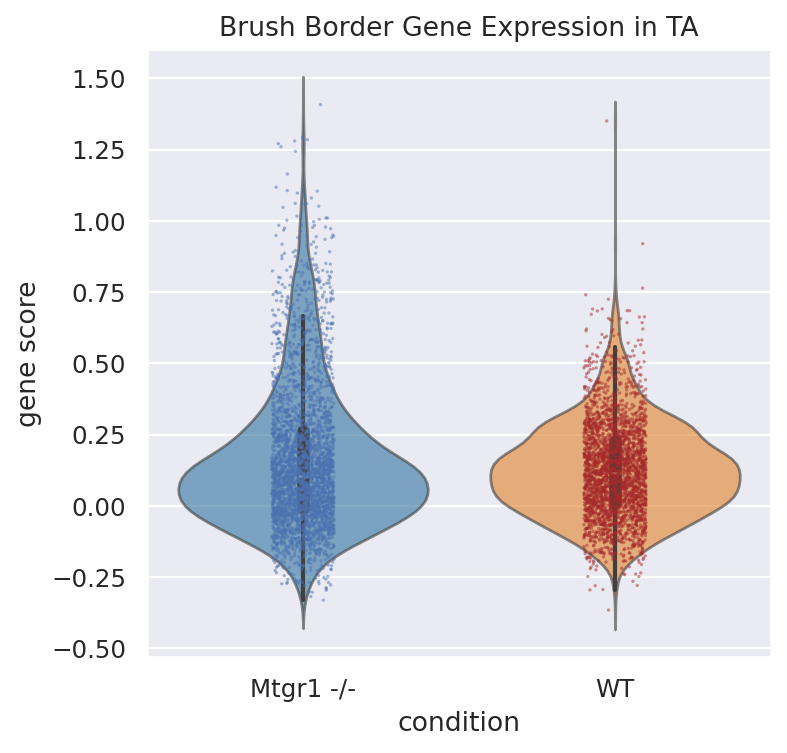

In [195]:
f,score_ax = plt.subplots( figsize = [5,5])
sn.set(font_scale=1)


    
sn.violinplot( data = ta.obs,  x = 'condition', y = 'brush_border_score_arcsinh', 
           palette=list( ta.uns['treatment_colors']), hue = 'condition',
          ax =score_ax, alpha = 0.6)
sn.stripplot( data = ta.obs,  x = 'condition', y = 'brush_border_score_arcsinh', 
          palette = ['b', 'brown'], hue = 'condition',
          ax = score_ax, size = 1.5, alpha = 0.5)
score_ax.set( ylabel= 'gene score')
t = score_ax.set( title= 'Brush Border Gene Expression in TA')

## composition plot

In [6]:
subsampled_epi = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [7]:
#dat_epi = dat_subsample[dat_subsample.obs['cell_type'] != 'RevSTM' ] 
dat_epi = subsampled_epi[subsampled_epi.obs['cell_type'] != 'RevSTM' ] 

In [9]:
cell_count_df = dat_epi.obs[['cell_type',  'condition']]

In [99]:
group_count_df = cell_count_df.groupby( ['condition','cell_type']).value_counts()

In [100]:
type( group_count_df ) #series
group_count_df = pd.DataFrame( group_count_df)

In [101]:
group_count_df.index[0]

('Mtgr1 -/-', 'ABS')

In [102]:
condition_counts = dat_epi.obs['condition'].value_counts()
condition_counts

condition
Mtgr1 -/-    6427
WT           6407
Name: count, dtype: int64

In [103]:
condition_counts['WT']

6407

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


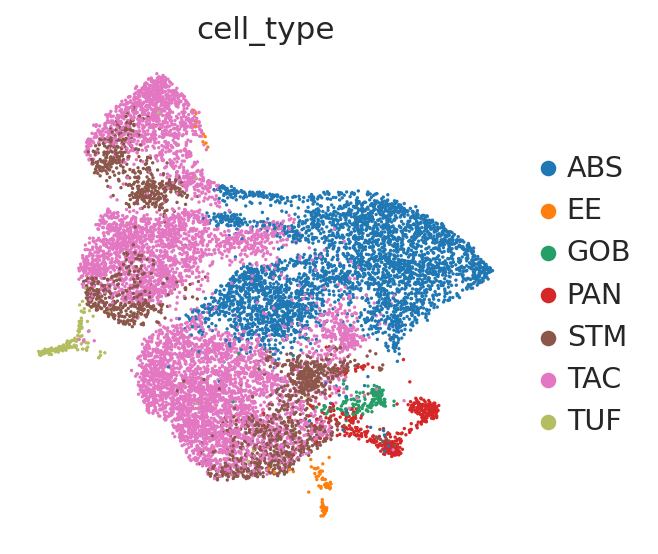

In [104]:
sc.pl.umap( dat_epi, color = 'cell_type' )

In [105]:
group_count_df

count
condition cell_type       
Mtgr1 -/- ABS         1738
          EE            10
          GOB            0
          PAN           67
          STM         1182
          TAC         3356
          TUF           74
WT        ABS         2050
          EE            80
          GOB          168
          PAN          399
          STM          590
          TAC         3040
          TUF           80

In [106]:
pct_count = []
for i in group_count_df.index:
    if ( i[0] == 'WT'):
        pct_count.append( group_count_df.loc[i, 'count']/condition_counts['WT'] )
    else:
        pct_count.append( group_count_df.loc[i, 'count']/condition_counts['Mtgr1 -/-'] )

In [107]:
group_count_df['pct_count'] = pct_count

In [108]:
group_count_df

count  pct_count
condition cell_type                  
Mtgr1 -/- ABS         1738   0.270422
          EE            10   0.001556
          GOB            0   0.000000
          PAN           67   0.010425
          STM         1182   0.183912
          TAC         3356   0.522172
          TUF           74   0.011514
WT        ABS         2050   0.319963
          EE            80   0.012486
          GOB          168   0.026221
          PAN          399   0.062276
          STM          590   0.092087
          TAC         3040   0.474481
          TUF           80   0.012486

In [109]:
group_count_df['condition'] = [ i[0] for i in group_count_df.index ]
group_count_df['cell_type'] = [ i[1] for i in group_count_df.index ]

In [110]:
group_count_df.reset_index(drop = True)

,count,pct_count,condition,cell_type
0,1738,0.270422,Mtgr1 -/-,ABS
1,10,0.001556,Mtgr1 -/-,EE
2,0,0.000000,Mtgr1 -/-,GOB
3,67,0.010425,Mtgr1 -/-,PAN
4,1182,0.183912,Mtgr1 -/-,STM
5,3356,0.522172,Mtgr1 -/-,TAC
6,74,0.011514,Mtgr1 -/-,TUF
7,2050,0.319963,WT,ABS
8,80,0.012486,WT,EE
9,168,0.026221,WT,GOB


In [111]:
x = np.arange(0, 10, step=1.5)
x[0:7]

array([0. , 1.5, 3. , 4.5, 6. , 7.5, 9. ])

In [113]:
dat_epi

View of AnnData object with n_obs × n_vars = 12834 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'treatment_colors', 'sample_colors', 'cell_type_colors', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts', 'full_norm'
    obsp: 'distances', 'connectivities'

In [117]:
dat_epi.uns['treatment_colors']

array(['#1f77b4', '#ff7f0e'], dtype='<U7')

/tmp/ipykernel_1747716/2066695869.py:2: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sn.barplot( data = group_count_df, x = 'cell_type', y = 'pct_count', hue = 'condition',


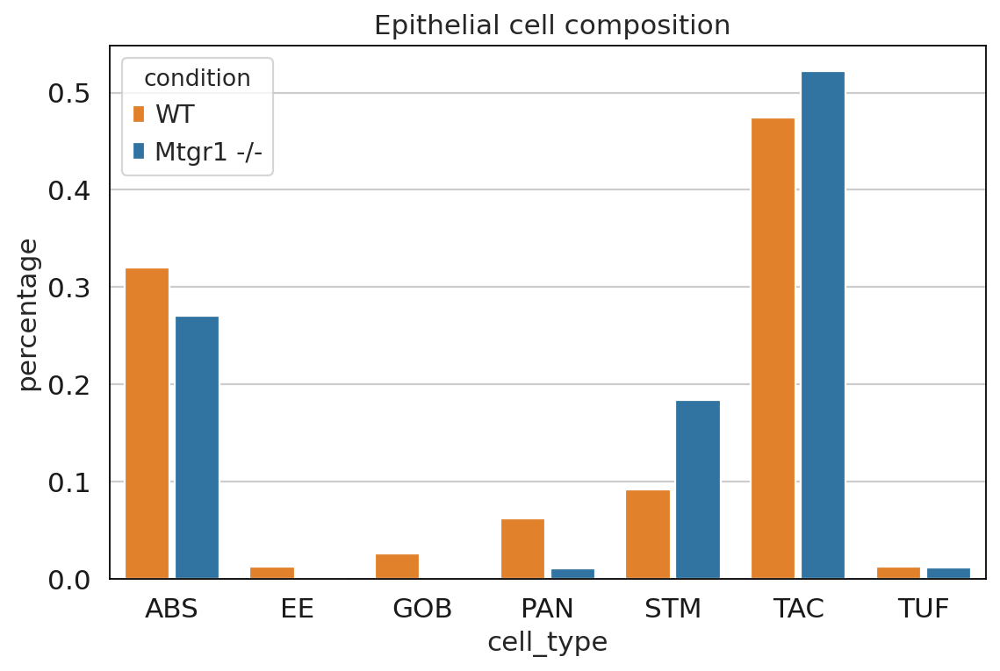

In [119]:
f,ax = plt.subplots(figsize = [8,5])
sn.barplot( data = group_count_df, x = 'cell_type', y = 'pct_count', hue = 'condition',
           hue_order=['WT', 'Mtgr1 -/-'], palette=dat_epi.uns['treatment_colors'][::-1], 
            dodge=True, width=0.8, ax = ax, gap = 0.1 )
t= ax.set_ylabel( "percentage")
t = ax.set_title(" Epithelial cell composition")
loc, lab = plt.xticks()
#plt.xticks(np.arange(0, 1, step=0.2)) 
#plt.xticks(ticks = x[0:7] )


### make new version of the barplot

In [21]:
cell_count_df = dat_epi.obs[['cell_type',   'sample']]

In [22]:
group_count_df = cell_count_df.groupby( ['sample','cell_type']).value_counts()

In [23]:
group_count_df

sample   cell_type
10868_1  ABS           553
         EE             19
         GOB            71
         PAN            94
         STM           244
         TAC           662
         TUF             9
10868_2  ABS           640
         EE             24
         GOB            49
         PAN           154
         STM           194
         TAC          1088
         TUF            25
10868_3  ABS           857
         EE             37
         GOB            48
         PAN           151
         STM           152
         TAC          1290
         TUF            46
10868_5  ABS          1468
         EE              0
         GOB             0
         PAN            67
         STM           668
         TAC          2135
         TUF            64
11283_1  ABS           270
         EE             10
         GOB             0
         PAN             0
         STM           514
         TAC          1221
         TUF            10
Name: count, dtype: int64

In [13]:
type( group_count_df)

pandas.core.series.Series

In [24]:
group_count_df = pd.DataFrame( group_count_df )

In [25]:
group_count_df2 = group_count_df.reset_index()

In [35]:
group_count_df2.head()

,sample,cell_type,count
0,10868_1,ABS,553
1,10868_1,EE,19
2,10868_1,GOB,71
3,10868_1,PAN,94
4,10868_1,STM,244


get percentage of each cell type in each sample

In [28]:
sample_count = subsampled_epi.obs['sample'].value_counts()

In [33]:
sample_count

sample
10868_5    4402
10868_3    2601
10868_2    2174
11283_1    2025
10868_1    1652
Name: count, dtype: int64

In [34]:
sample_count['10868_5']

4402

In [36]:
pct_count = []
for i in group_count_df2.index:
    s = group_count_df2.loc[i, 'sample']
    s_count = sample_count[s]
    pct_count.append( group_count_df2.loc[i, 'count']/s_count )

In [37]:
group_count_df2['pct'] = pct_count

In [38]:
group_count_df2.head(3)

,sample,cell_type,count,pct
0,10868_1,ABS,553,0.334746
1,10868_1,EE,19,0.011501
2,10868_1,GOB,71,0.042978


In [39]:
condition = []
for i in group_count_df2.index:
    if( group_count_df2.loc[i, 'sample'] == '10868_5' or group_count_df2.loc[i, 'sample'] == '11283_1' ):
        condition.append( 'Mtgr1 -/-')
    else:
        condition.append( 'WT' )

In [40]:
group_count_df2['condition' ] = condition

<Axes: xlabel='cell_type', ylabel='pct'>

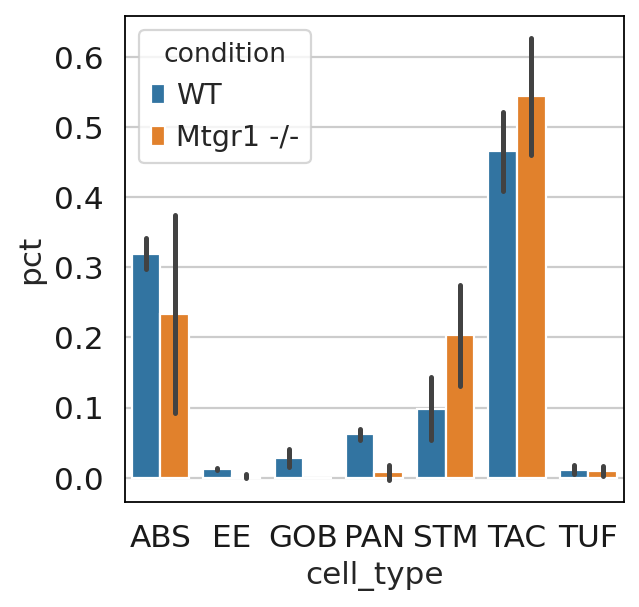

In [43]:
f,ax = plt.subplots()
sn.barplot( data = group_count_df2, x =  'cell_type', y='pct', hue = 'condition', errorbar='sd' )

In [44]:
subsampled_epi

AnnData object with n_obs × n_vars = 12854 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

/tmp/ipykernel_1774804/1706538059.py:2: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sn.barplot( data = group_count_df2, x = 'cell_type', y = 'pct', hue = 'condition',


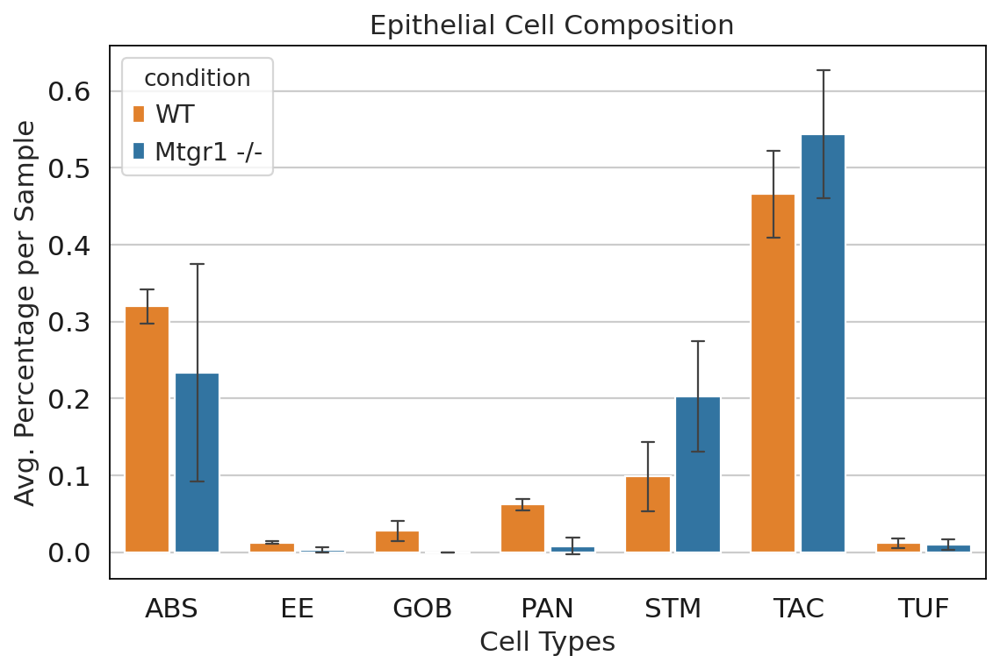

In [55]:
f,ax = plt.subplots(figsize = [8,5])
sn.barplot( data = group_count_df2, x = 'cell_type', y = 'pct', hue = 'condition',
            errorbar='sd',
           err_kws = {'linewidth':1, }, capsize = 0.2, 
           hue_order=['WT', 'Mtgr1 -/-'], palette=subsampled_epi.uns['treatment_colors'][::-1],
           ax = ax, gap = 0.1, )
t= ax.set_ylabel( "Avg. Percentage per Sample")
t= ax.set_xlabel( "Cell Types")
t = ax.set_title(" Epithelial Cell Composition")
loc, lab = plt.xticks()

## save data

In [33]:
#com.X.sum(axis = 1)

In [34]:
com.X = com.raw.X

In [35]:
com.write("./new_sample_10868_filtered/combined_12356.h5ad" )

In [194]:
df2.to_csv("./brush_border_gene_exp_df.csv", header = True, index = True)

In [60]:
dat_subsample.X = dat_subsample.raw.X
dat_subsample.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [61]:
dat_subsample.write("new_sample_10868_filtered/subsampled_epi_12356.h5ad", compression = 'gzip')

In [57]:
group_count_df2.to_csv("./cell_composition_df_combined_subsampled_epi.csv", header = True, index = True)

save the brush border gene score

In [20]:
ab.obs['brush_border_score_arcsinh'].to_csv("brush_border_gene_score.csv", header = True, index = True) 

In [186]:
stem.obs['brush_border_score_arcsinh'].to_csv("brush_border_gene_score_in_stem.csv", header = True, index = True) 

In [196]:
ta.obs['brush_border_score_arcsinh'].to_csv("brush_border_gene_score_in_TAC.csv", header = True, index = True) 

In [198]:
dat.obs[['sample', 'cell_type', 'treatment', 'condition']].to_csv("./new_sample_10868_filtered/obs_subsampled_epi_12356.csv", header=True, index = True)

save enrichment result

In [125]:
enr_wt_up = pd.concat( [t5_wt_enr_ls[i].results for i in range(3) ], axis = 0 )
#t5_wt_enr_ls[2].results

In [124]:
wt_enr.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Cytoplasmic Translation (GO:0002181),31/93,3.527610e-24,9.531602e-21,0,0,16.720588,902.935537,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
1,GO_Biological_Process_2023,Macromolecule Biosynthetic Process (GO:0009059),39/183,3.936926e-22,5.318787e-19,0,0,9.145139,450.731631,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
2,GO_Biological_Process_2023,Peptide Biosynthetic Process (GO:0043043),33/158,1.249600e-18,1.125474e-15,0,0,8.830250,364.015646,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
3,GO_Biological_Process_2023,Translation (GO:0006412),38/234,2.498163e-17,1.687509e-14,0,0,6.517477,249.152673,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...
4,GO_Biological_Process_2023,Gene Expression (GO:0010467),38/296,6.509221e-14,3.517583e-11,0,0,4.935269,149.849440,RPL4;RPL30;RPL3;RPL32;RPL31;RPLP1;RPL12;RPLP0;...


In [126]:
enr_mut_up = pd.concat( [t5_mut_enr_ls[i].results for i in range(3) ], axis = 0 )
#t5_wt_enr_ls[2].results

In [129]:
enr_mut_up.to_csv("./enrichment_result_mut_up.csv", header = True, index = True)

In [130]:
enr_wt_up.to_csv("./enrichment_result_wt_up.csv", header = True, index = True)